# Sentinel-2 data STAC access and time series processing

Author: Andreas Mayr

Date: 27 March 2023


**Description:**

This notebook illustrates how to query and download Sentinel-2 satellite imagery from Amazon Web Service (AWS) using a SpatioTemporal Asset Catalog (STAC). Furthermore, it shows how to work with the data using xarray and how to perform tasks like subsetting, cloud masking, spectral index calculation, temporal aggregation, and trend analysis. A few simple processing steps let you explore the development of the Normalized Difference Vegetation Index (NDVI) in spring and summer, including e.g. the seasonal greening of mountain grasslands.

The notebook heavily relies on the packages [pystac-client](https://pystac-client.readthedocs.io/en/stable/), [stackstac](https://stackstac.readthedocs.io/en/latest/), and [xarray](https://docs.xarray.dev/en/stable/). It uses code from a tutorial provided [here](https://stackstac.readthedocs.io/en/latest/basic.html).

## Set up the environment

Use the `m1_etrainee` environment containing the required packages, or create it now to install the packages.

```
conda create -n m1_etrainee python=3.9
conda activate m1_etrainee
conda install mamba
mamba install ipykernel earthengine-api eemont geemap wxee pygis geopandas seaborn hvplot scikit-learn datashader stackstac xarrayutils xmovie
```

Some of the packages are not needed here but in related Notebooks. Now we might have to re-start or refresh VSCode to actually be able to select the environment as a kernel.

## Query data via STAC

Import packages.

In [1]:
import pystac_client
import stackstac
import pyproj
import xarray
import rioxarray

Define a point of interest to intersect our query.

In [2]:
lon, lat = 11.39, 47.26     # Innsbruck

Use the pystac_client package and [element84](https://www.element84.com/earth-search/)’s search endpoint to look for items from the ```sentinel-s2-l2a-cogs``` collection on Amazon Web Service (AWS). As search criteria we use a maximum cloud cover (per scene) and a time period.

In [3]:
URL = "https://earth-search.aws.element84.com/v0"
catalog = pystac_client.Client.open(URL)

In [4]:
%%time
items = catalog.search(
    intersects=dict(type="Point", coordinates=[lon, lat]),
    collections=["sentinel-s2-l2a-cogs"],
    query =  ['eo:cloud_cover<50'],
    datetime="2021-04-01/2021-08-31"
).get_all_items()
len(items)

CPU times: total: 62.5 ms
Wall time: 1.52 s


35

Use `stackstac` to turn those STAC items into a lazy xarray. Without specifying anything, this makes use of dask and reads the data in chunks, with one chunk shaped (1, 1, 1024, 1024) in the time, band, y, x dimensions (Read more about chunk sizes [here](https://docs.dask.org/en/latest/array-best-practices.html), [here](https://xcube.readthedocs.io/en/latest/overview.html#data-chunks), and [here](https://gallery.pangeo.io/repos/pangeo-data/landsat-8-tutorial-gallery/landsat8.html).). Using all the defaults, our data will be in its native coordinate reference system, at the finest resolution of all the assets.

In [5]:
%time stack = stackstac.stack(items)

CPU times: total: 46.9 ms
Wall time: 51.9 ms


Now print info about this xarray.DataArray called 'stack'. Note that everything has run quickly so far, despite the large data volume covered by our query. Up to now, we are only working with metadata, no download or processing of any pixel values.

In [6]:
stack

,Array,Chunk
Bytes,534.46 GiB,8.00 MiB
Shape,"(35, 17, 10980, 10980)","(1, 1, 1024, 1024)"
Count,73185 Tasks,71995 Chunks
Type,float64,numpy.ndarray


We are only interested in a relatively small area around our main point of interest (defined above for intersection). So we convert the coordinates of this point into the native CRS of the satellite data, add a buffer and then use this rectangle to slice ("clip") the stacked array spatially.

In [7]:
x_utm, y_utm = pyproj.Proj(stack.crs)(lon, lat)
buffer = 5000  # meters

Now we have a much smaller DataArray (with 1000 by 1000 cells in x/y) called stack_aoi.

In [8]:
stack_aoi = stack.loc[..., y_utm+buffer:y_utm-buffer, x_utm-buffer:x_utm+buffer]
stack_aoi

,Array,Chunk
Bytes,4.43 GiB,3.16 MiB
Shape,"(35, 17, 1000, 1000)","(1, 1, 678, 610)"
Count,75565 Tasks,2380 Chunks
Type,float64,numpy.ndarray


We want only the four 10-m bands and the Scene Classification (SCL) layer.

In [9]:
stack_aoi = stack_aoi.sel(band = ['B02', 'B03', 'B04', 'B08', 'SCL'])
stack_aoi

,Array,Chunk
Bytes,1.30 GiB,3.16 MiB
Shape,"(35, 5, 1000, 1000)","(1, 1, 678, 610)"
Count,76265 Tasks,700 Chunks
Type,float64,numpy.ndarray


Now we trigger the stacking of these selected bands for our area-of-interest. This may take some minutes.

In [10]:
%%time
data = stack_aoi.compute()

CPU times: total: 54.8 s
Wall time: 4min 58s


In [11]:
data

<xarray.DataArray 'stackstac-4562f648cd5149540cccda1f5a004856' (time: 35,
                                                                band: 5,
                                                                y: 1000, x: 1000)>
array([[[[1.3129e+04, 1.2153e+04, 1.2209e+04, ..., 1.8400e+02,
          1.9900e+02, 1.8600e+02],
         [1.2824e+04, 1.3097e+04, 1.3017e+04, ..., 1.9100e+02,
          2.0500e+02, 2.0300e+02],
         [1.2417e+04, 1.3104e+04, 1.3577e+04, ..., 2.0500e+02,
          2.0700e+02, 2.0900e+02],
         ...,
         [2.1300e+02, 2.3700e+02, 4.7400e+02, ..., 1.5430e+03,
          1.9900e+03, 2.4620e+03],
         [2.1100e+02, 1.7800e+02, 2.8200e+02, ..., 1.8520e+03,
          1.8380e+03, 2.3080e+03],
         [3.2000e+02, 1.6200e+02, 1.9400e+02, ..., 1.9290e+03,
          1.5350e+03, 1.5050e+03]],

        [[1.3055e+04, 1.2049e+04, 1.2064e+04, ..., 1.7600e+02,
          2.1900e+02, 1.9800e+02],
         [1.2845e+04, 1.3066e+04, 1.2967e+04, ..., 1.8200e+02,
          2.7200e+02, 2.2100e+02],
         [1.2360e+04, 1.3113e+04, 1.3719e+04, ..., 2.1500e+02,
          2.6600e+02, 2.3100e+02],
...
         [2.5240e+03, 2.7640e+03, 2.4980e+03, ..., 3.4220e+03,
          3.8840e+03, 4.8160e+03],
         [2.6360e+03, 2.5460e+03, 2.4480e+03, ..., 3.0460e+03,
          3.0180e+03, 3.1860e+03],
         [2.0360e+03, 2.0800e+03, 2.3320e+03, ..., 3.1400e+03,
          3.1740e+03, 2.4180e+03]],

        [[3.0000e+00, 3.0000e+00, 3.0000e+00, ..., 4.0000e+00,
          4.0000e+00, 4.0000e+00],
         [3.0000e+00, 3.0000e+00, 3.0000e+00, ..., 4.0000e+00,
          4.0000e+00, 4.0000e+00],
         [2.0000e+00, 2.0000e+00, 2.0000e+00, ..., 4.0000e+00,
          4.0000e+00, 4.0000e+00],
         ...,
         [4.0000e+00, 4.0000e+00, 4.0000e+00, ..., 4.0000e+00,
          4.0000e+00, 4.0000e+00],
         [4.0000e+00, 4.0000e+00, 4.0000e+00, ..., 4.0000e+00,
          4.0000e+00, 4.0000e+00],
         [4.0000e+00, 4.0000e+00, 4.0000e+00, ..., 4.0000e+00,
          4.0000e+00, 4.0000e+00]]]])
Coordinates: (12/26)
  * time                        (time) datetime64[ns] 2021-04-01T10:27:39 ......
    id                          (time) <U24 'S2B_32TPT_20210401_0_L2A' ... 'S...
  * band                        (band) <U8 'B02' 'B03' 'B04' 'B08' 'SCL'
  * x                           (x) float64 6.758e+05 6.758e+05 ... 6.858e+05
  * y                           (y) float64 5.242e+06 5.242e+06 ... 5.232e+06
    proj:epsg                   int32 32632
    ...                          ...
    constellation               <U10 'sentinel-2'
    title                       (band) <U31 'Band 2 (blue)' ... 'Scene Classi...
    common_name                 (band) object 'blue' 'green' 'red' 'nir' None
    center_wavelength           (band) object 0.4966 0.56 0.6645 0.8351 None
    full_width_half_max         (band) object 0.098 0.045 0.038 0.145 None
    epsg                        int32 32632
Attributes:
    spec:        RasterSpec(epsg=32632, bounds=(600000.0, 5190240.0, 709800.0...
    crs:         epsg:32632
    transform:   | 10.00, 0.00, 600000.00|\n| 0.00,-10.00, 5300040.00|\n| 0.0...
    resolution:  10.0

*The data was not read in chunks!? Why? How could we enforce this?*

Try plotting some data:

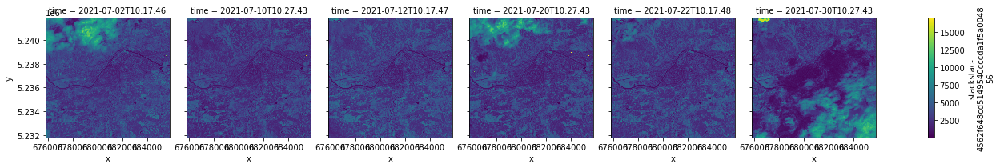

In [12]:
data.sel(band='B08').sel(time='2021-07').plot.imshow(col='time')

## Cloud masking

We use the [scene classification](https://sentinel.esa.int/web/sentinel/technical-guides/sentinel-2-msi/level-2a/algorithm) provided by ESA via the SCL band as a simple (but not the best) means to mask clouds and other problematic pixels.

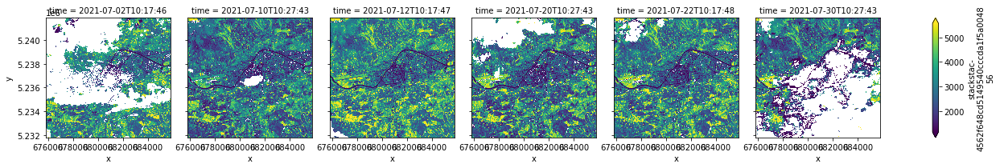

In [13]:
import dask.array as da

scl = data.sel(band=["SCL"])
# Sentinel-2 Scene Classification Map: nodata, saturated/defective, dark, cloud shadow, cloud med. prob., cloud high prob., cirrus
invalid_data = da.isin(scl, [0, 1, 2, 3, 8, 9, 10])
valid_data = data.where(~invalid_data)
# Show some of the cloud masked data
valid_data.sel(band='B08').sel(time='2021-07').plot.imshow(col='time', robust=True)

Or show RGB true color composites.

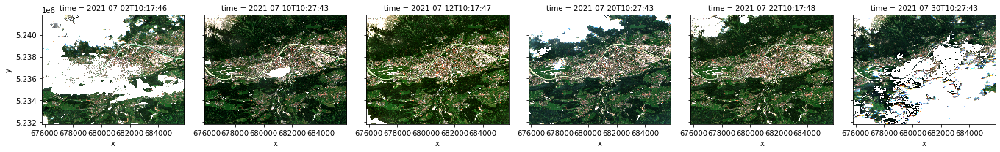

In [14]:
valid_data.sel(time='2021-07').sel(band=['B04', 'B03', 'B02']).plot.imshow(col='time', robust=True)

## Spectral index calculation (NDVI)

We calculate the Normalized Difference Vegetation Index (NDVI). If you need more indices consider the [Spyndex](https://spyndex.readthedocs.io/) package.

In [15]:
# Compute the NDVI from the NIR (B8) and red (B4) bands
nir, red = valid_data.sel(band='B08'), valid_data.sel(band='B04')
NDVI = (nir - red) / (nir + red)

NDVI is a new DataArray. We select the NDVI raster closest to a specific date for export as GeoTIFF.

In [16]:
NDVI.sel(time='2021-07-15', method='nearest').rio.to_raster("C:\work\etrainee\stac_exports/S2-NDVI_midjuly.tif")

Let's plot one month of NDVI rasters.

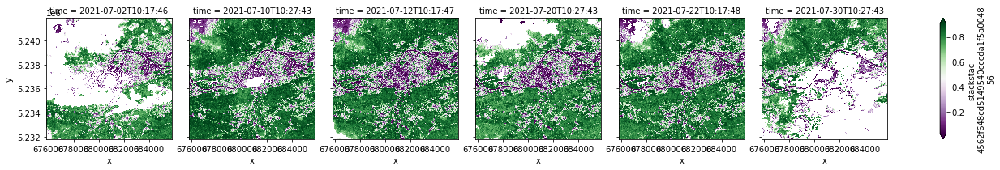

In [17]:
NDVI.sel(time='2021-07').plot.imshow(col='time', cmap="PRGn", robust=True)

## Time series operations

### Interpolate missing values

Let's fill missing values by (linear) interpolation between observations.

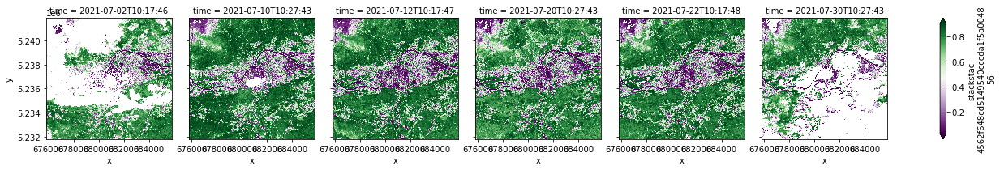

In [18]:
NDVI.sel(time='2021-07').interpolate_na(dim='time').plot(col='time', cmap="PRGn", robust=True)

### Resampling

We resample/aggregate to one month temporal resolution by computing the mean.

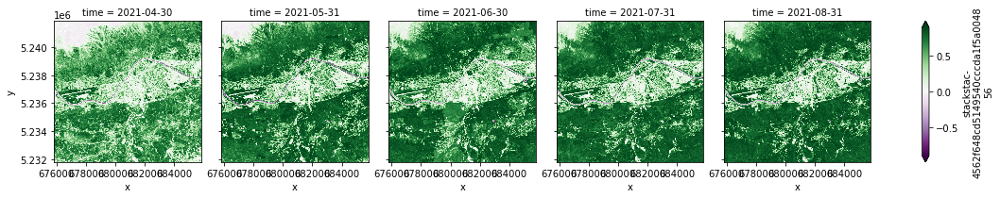

In [19]:
NDVI.resample(time='1M').mean().plot(col='time', cmap="PRGn", robust=True)

### Trend analysis

The [xarrayutils](https://xarrayutils.readthedocs.io/en/latest/index.html) package contains a convenient linear_trend function. We use this to fit a linear trend to our NDVI time series.

In [20]:
from xarrayutils import linear_trend
NDVI_regressed = linear_trend(NDVI, 'time')

Plot the resulting slope along with r-value, p-value, and standard error as maps (with default colormaps).

C:\Users\Andi\Anaconda3\envs\pystac\lib\site-packages\dask\array\numpy_compat.py:40: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
C:\Users\Andi\Anaconda3\envs\pystac\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Andi\Anaconda3\envs\pystac\lib\site-packages\dask\core.py:119: RuntimeWarning: divide by zero encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


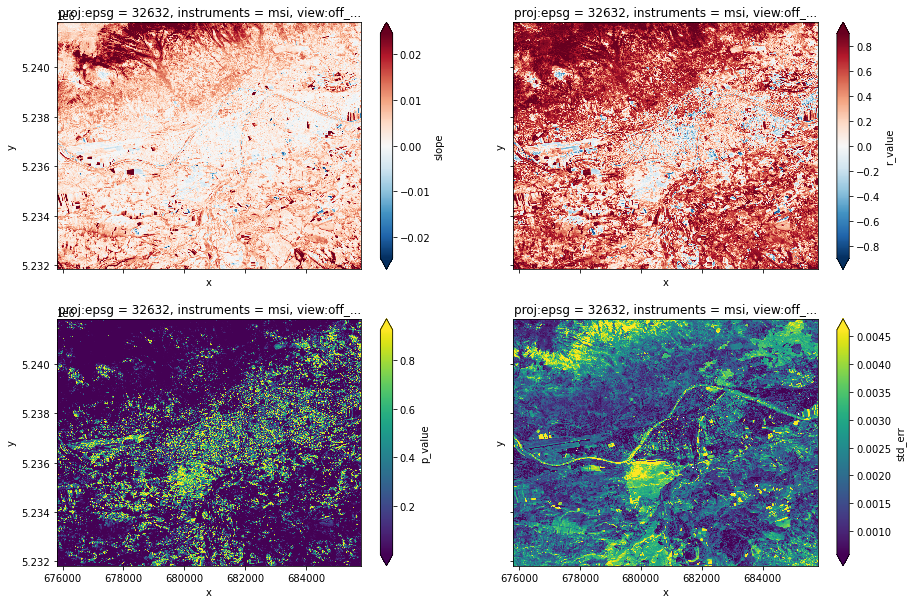

In [21]:
from matplotlib import pyplot as plt
fig, axes = plt.subplots(2,2, figsize=(15,10), sharex=True, sharey=True)
NDVI_regressed.slope.plot(robust=True, ax=axes[0,0])
NDVI_regressed.r_value.plot(robust=True, ax=axes[0,1])
NDVI_regressed.p_value.plot(robust=True, ax=axes[1,0])
NDVI_regressed.std_err.plot(robust=True, ax=axes[1,1])

Create an interactive map to inspect the slope of the trend in more detail.

In [24]:
import hvplot.xarray
import holoviews as hv
NDVI_regressed.slope.hvplot(x='x', y='y', aspect=1, clim=(-0.02,0.02), cmap="PRGn", title='NDVI slope April - Aug')

C:\Users\Andi\Anaconda3\envs\pystac\lib\site-packages\dask\array\numpy_compat.py:40: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
C:\Users\Andi\Anaconda3\envs\pystac\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


:Image   [x,y]   (slope)

## Create an animation

Let's create an animation of our NDVI time series using the [xmovie](https://xmovie.readthedocs.io/en/latest/) package. We resample to weekly means of NDVI and interpolate missing values.

In [25]:
%%time
NDVI_weekly = NDVI.resample(time='1W').mean()
NDVI_weekly = NDVI_weekly.chunk(dict(time=-1))                        # rechunk into a single dask array chunk along the time dimension
NDVI_weekly = NDVI_weekly.interpolate_na(dim='time')

CPU times: total: 109 ms
Wall time: 112 ms


Now be patient while the movie is created.

In [30]:
%%time
from xmovie import Movie
mov = Movie(NDVI_weekly.chunk({'time':1}), dpi=100, vmin=-0.8, vmax=0.8, cmap="PRGn")

CPU times: total: 1min 28s
Wall time: 1min 13s


Use parallelization by Dask for saving the frames to an MP4 video clip (or a GIF). For this to work we have chunked the input dataarray with a single step along the dimension that represent our frames.

In [31]:
%%time
mov.save('NDVI_animation.mp4', overwrite_existing=True, parallel=True, framerate=3)